In [82]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


import cv2
import math

from tensorflow.keras import models, layers
from tensorflow.keras.optimizers import RMSprop, Adam

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**1. Import the libraries, load dataset, print shape of data, visualize the images in train and test set**

In [2]:
# Load train & test images files
TrainImages = np.load('/content/drive/MyDrive/COVID-19 Project/trainimage.npy')
TestImages = np.load('/content/drive/MyDrive/COVID-19 Project/testimage.npy')

# Load train & test labels files
TrainLabels = pd.read_csv('/content/drive/MyDrive/COVID-19 Project/trainLabels.csv')
TestLabels = pd.read_csv('/content/drive/MyDrive/COVID-19 Project/testLabels.csv')


In [3]:
print('Train Images shape: ',TrainImages.shape)
print('Test Images shape: ',TestImages.shape)
print('Train Labels shape: ',TrainLabels.shape)
print('Test Labels shape: ',TestLabels.shape)

Train Images shape:  (251, 128, 128, 3)
Test Images shape:  (66, 128, 128, 3)
Train Labels shape:  (251, 1)
Test Labels shape:  (66, 1)


In [4]:
TrainLabels.iloc[0]

Label    Viral Pneumonia
Name: 0, dtype: object

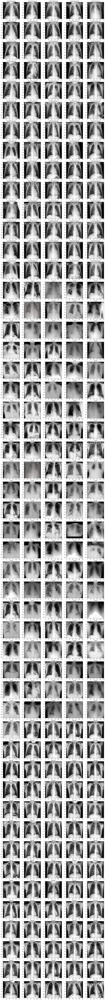

In [5]:
# visualize the images in train set
plt.figure(figsize=(20,200))
for i in range(250):
    plt.subplot(50, 5, i + 1)
    plt.imshow(TrainImages[i])
    plt.title(TrainLabels.iloc[i].Label)
    
      

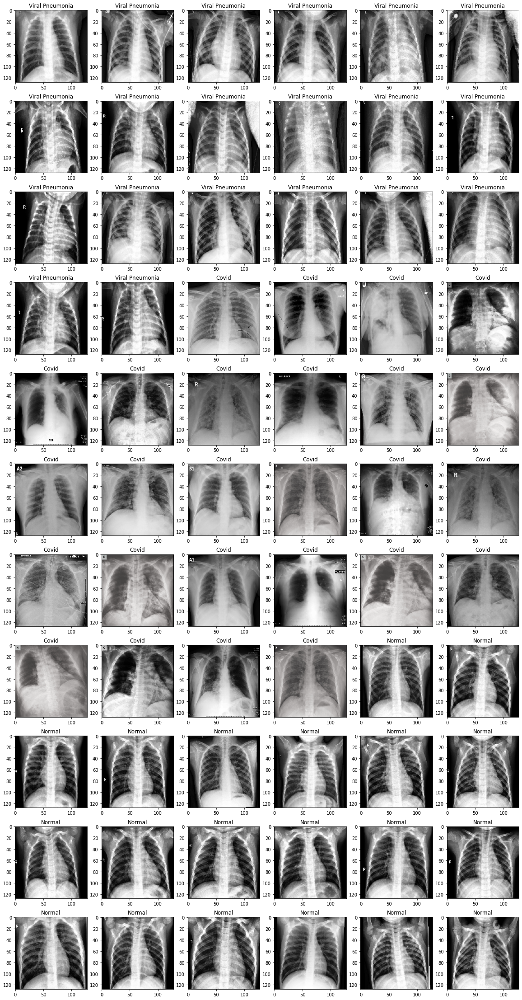

In [ ]:
# visualize the images in test set
plt.figure(figsize=(20,40))
for i in range(66):
    plt.subplot(11, 6, i + 1)
    plt.imshow(TestImages[i])
    plt.title(TestLabels.iloc[i].Label)

**2. Explore the data**

In [ ]:
# value count in train set & number of unique labels in training set
print('number of',TrainLabels.nunique())
print(TrainLabels.value_counts())

number of Label    3
dtype: int64
Label          
Covid              111
Viral Pneumonia     70
Normal              70
dtype: int64


In [ ]:
# value count in test set
print(TestLabels.value_counts())

Label          
Covid              26
Viral Pneumonia    20
Normal             20
dtype: int64


**3. Data Pre-processing**

the images have 3 channels for RGB, but I think the colored images are not importnt as it may form some noise and, after all it's x-ray image.

So I'll convert the images to gray scale.

shape of the gray train set:  (251, 128, 128)


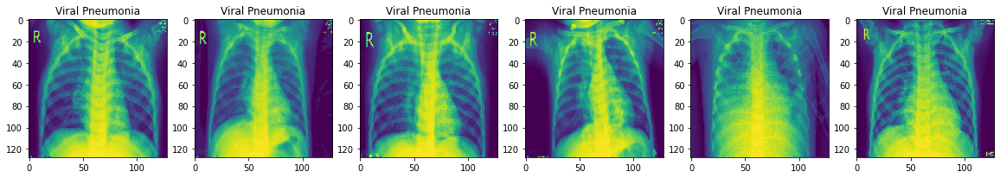

In [6]:
# Gray-Scale for train images

Gray_TrainImages = []
for image in TrainImages:
  GryImg = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  Gray_TrainImages.append(GryImg)

# shape of the gray train set 
Gray_TrainImages = np.array(Gray_TrainImages)
print('shape of the gray train set: ',Gray_TrainImages.shape)

# visualize the train Images after Gray-scale
plt.figure(figsize=(20,20))
for i in range(6):
    plt.subplot(1, 6, i + 1)
    plt.imshow(Gray_TrainImages[i])
    plt.title(TrainLabels.iloc[i].Label)

shape of the gray train set:  (66, 128, 128)


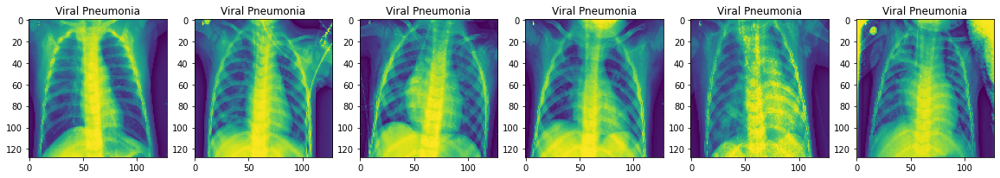

In [7]:
# Gray-Scale for test images

Gray_TestImages = []
for image in TestImages:
  GryImg = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  Gray_TestImages.append(GryImg)

# shape of the gray train set 
Gray_TestImages = np.array(Gray_TestImages)
print('shape of the gray train set: ',Gray_TestImages.shape)

# visualize the train Images after Gray-scale
plt.figure(figsize=(20,20))
for i in range(6):
    plt.subplot(1, 6, i + 1)
    plt.imshow(Gray_TestImages[i])
    plt.title(TestLabels.iloc[i].Label)

In [8]:
# Gaussian Blurring Train Images with kernel size of (5, 5).
Blurred_TrainImages = []

for image in Gray_TrainImages:
    BlurImage = cv2.GaussianBlur(image, (5, 5), 0)       
    Blurred_TrainImages.append(BlurImage)

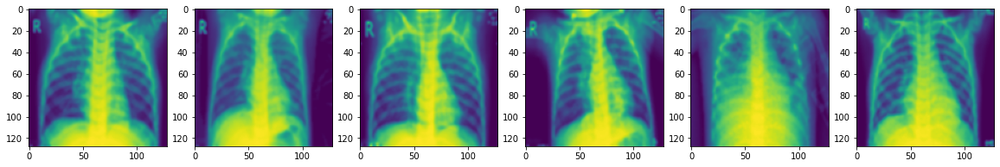

In [9]:
# visualize the Train Images after blurring
plt.figure(figsize=(20,20))
for i in range(6):
    plt.subplot(1, 6, i + 1)
    plt.imshow(Blurred_TrainImages[i])

In [10]:
# Gaussian Blurring Test Images with kernel size of (5, 5).
Blurred_TestImages = []

for image in Gray_TestImages:
    BlurImage = cv2.GaussianBlur(image, (5, 5), 0)       
    Blurred_TestImages.append(BlurImage)

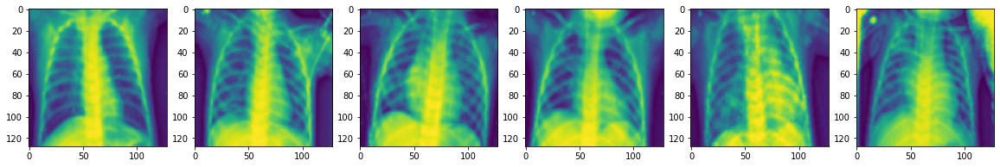

In [ ]:
# visualize the Test Images after blurring
plt.figure(figsize=(20,20))
for i in range(6):
    plt.subplot(1, 6, i + 1)
    plt.imshow(Blurred_TestImages[i])

In [11]:
# Normalization of data.

# converting to float
Blurred_TrainImages = np.array(Blurred_TrainImages, dtype=np.float32)
Blurred_TestImages = np.array(Blurred_TestImages, dtype=np.float32)

Blurred_TrainImages = Blurred_TrainImages / 255.0
Blurred_TestImages = Blurred_TestImages / 255.0

Blurred_TrainImages[0]

array([[0.09803922, 0.11372549, 0.14509805, ..., 0.5019608 , 0.48235294,
        0.4627451 ],
       [0.09803922, 0.11372549, 0.13725491, ..., 0.49411765, 0.48235294,
        0.45882353],
       [0.09411765, 0.10588235, 0.1254902 , ..., 0.48235294, 0.49019608,
        0.47843137],
       ...,
       [0.02352941, 0.03137255, 0.03529412, ..., 0.        , 0.        ,
        0.00392157],
       [0.04313726, 0.07058824, 0.10196079, ..., 0.        , 0.        ,
        0.        ],
       [0.05490196, 0.10196079, 0.14509805, ..., 0.        , 0.        ,
        0.        ]], dtype=float32)

**4. Make data compatible**

In [12]:

# Reshape data into shapes compatible with Keras models
print(Blurred_TrainImages.shape)
print(Blurred_TestImages.shape)
print(TrainLabels.shape)
print(TestLabels.shape)

(251, 128, 128)
(66, 128, 128)
(251, 1)
(66, 1)


In [13]:
Blurred_TrainImages = Blurred_TrainImages.reshape(TrainImages.shape[0], 128, 128, 1)
Blurred_TestImages = Blurred_TestImages.reshape(TestImages.shape[0], 128, 128, 1)

print(Blurred_TrainImages.shape)
print(Blurred_TestImages.shape)
# shape is the same, it's now compatible with keras.

(251, 128, 128, 1)
(66, 128, 128, 1)


In [62]:
# Convert labels to one hot vectors.
from sklearn.preprocessing import LabelBinarizer
ohv = LabelBinarizer()
y_trainOHV = ohv.fit_transform(TrainLabels)
y_testOHV = ohv.fit_transform(TestLabels)

#import tensorflow.keras as ts
#ts.utils.to_categorical(y_TrainLabels)
#ts.utils.to_categorical(y_TestLabels)

##y_trainOHV = pd.get_dummies(TrainLabels)
#y_testOHV = pd.get_dummies(TestLabels)

print(y_trainOHV.shape)
print(y_testOHV.shape)

(251, 3)
(66, 3)


In [66]:
y_trainOHV[0:5]

array([[0, 0, 1],
       [0, 0, 1],
       [0, 0, 1],
       [0, 0, 1],
       [0, 0, 1]])

In [67]:
y_testOHV[0:5]

array([[0, 0, 1],
       [0, 0, 1],
       [0, 0, 1],
       [0, 0, 1],
       [0, 0, 1]])

**5. Building CNN**

In [68]:
from tensorflow.keras.layers import Conv2D,Flatten,Dense
from tensorflow.keras.models import Sequential
from sklearn.model_selection import train_test_split

#batch_size = None

model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), padding='same', activation="relu", input_shape=(128, 128, 1)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))

model.add(layers.Conv2D(64, (3, 3), padding='same', activation="relu"))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.3))

model.add(layers.Conv2D(128, (3, 3), padding='same', activation="relu"))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.4))

model.add(layers.Conv2D(256, (3, 3), padding='same', activation="relu"))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.5))


model.add(layers.GlobalMaxPooling2D())
model.add(layers.Dense(128, activation="relu"))
#model.add(layers.Dropout(0.2))
model.add(layers.Dense(64, activation="relu"))
#model.add(layers.Dropout(0.2))
model.add(layers.Dense(3, activation="softmax"))



# Set the optimizer and loss function.
#optimizer = Adam(learning_rate=0.001,beta_1=0.9,beta_2=0.999,epsilon=1e-07,amsgrad=False,name='Adam')
optimizer = Adam(learning_rate=0.001,name='Adam')
model.compile(optimizer = optimizer, loss="categorical_crossentropy", metrics=["accuracy"])

x_train_pro = Blurred_TrainImages
x_tset_pro = Blurred_TestImages
#y_train = y_trainOHV
#y_test = y_testOHV

x_test, x_val, y_test, y_val = train_test_split(x_tset_pro, y_testOHV, test_size = 0.2, random_state=7)
#x_train, x_test, y_train, y_test = train_test_split(Blurred_TestImages, y_TestLabels, test_size = 0.5, random_state=7)

# Fit the model
model.fit( x_train_pro, y_trainOHV, batch_size=30, epochs=15, validation_data = (x_tset_pro, y_testOHV))


score = model.evaluate(x_tset_pro, y_testOHV)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

Epoch 1/15
9/9 [==============================] - 1s 43ms/step - loss: 5.8445 - accuracy: 0.3631 - val_loss: 1.0958 - val_accuracy: 0.3939
Epoch 2/15
9/9 [==============================] - 0s 20ms/step - loss: 1.2278 - accuracy: 0.5883 - val_loss: 1.0926 - val_accuracy: 0.3939
Epoch 3/15
9/9 [==============================] - 0s 19ms/step - loss: 0.6272 - accuracy: 0.7583 - val_loss: 1.0978 - val_accuracy: 0.3939
Epoch 4/15
9/9 [==============================] - 0s 19ms/step - loss: 0.5904 - accuracy: 0.7597 - val_loss: 1.1089 - val_accuracy: 0.3939
Epoch 5/15
9/9 [==============================] - 0s 19ms/step - loss: 0.3622 - accuracy: 0.8470 - val_loss: 1.1190 - val_accuracy: 0.3939
Epoch 6/15
9/9 [==============================] - 0s 19ms/step - loss: 0.4220 - accuracy: 0.8110 - val_loss: 1.1277 - val_accuracy: 0.3939
Epoch 7/15
9/9 [==============================] - 0s 18ms/step - loss: 0.5078 - accuracy: 0.8196 - val_loss: 1.1453 - val_accuracy: 0.3939
Epoch 8/15
9/9 [===========

the accuracy is very low only 39%, I will resize the images to a higher resolution trying to increase the accuracy.

In [69]:
# Resizing the images sets to 256x256 pixels

m = 256 # image hieght / image width
x_train_pro_rsz=[]
for im in x_train_pro:
  img = cv2.resize(im, (m,m))
  x_train_pro_rsz.append(img)

#x_train_pro_rsz = np.array(x_train_pro_rsz)
####################################################################################3
x_tset_pro_rsz=[]
for im in x_tset_pro:
  img = cv2.resize(im, (m,m))
  x_tset_pro_rsz.append(img)

#x_tset_pro_rsz = np.array(x_tset_pro_rsz)
#######################################################################################


#print(x_train_pro_rsz.shape)
#print(x_tset_pro_rsz.shape)

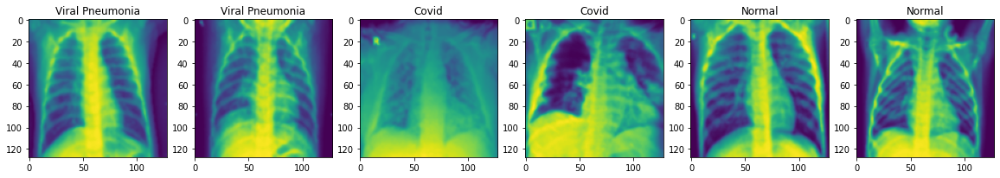

In [70]:
# before resizing
plt.figure(figsize=(20,20))
for n,i in enumerate([0,10,35,40,60,65]):
    plt.subplot(1, 6, n + 1)
    plt.imshow(np.reshape(x_tset_pro[i],(128,128)))
    plt.title(TestLabels.iloc[i].Label)

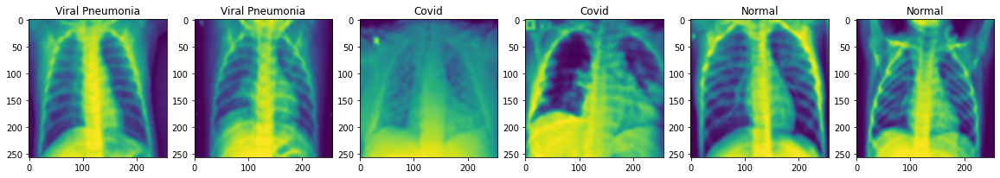

In [22]:
# after resizing
plt.figure(figsize=(20,20))
for n,i in enumerate([0,10,35,40,60,65]):
    plt.subplot(1, 6, n + 1)
    plt.imshow(x_tset_pro_rsz[i])
    plt.title(TestLabels.iloc[i].Label)

In [71]:
x_train_pro_rsz = np.array(x_train_pro_rsz)
x_tset_pro_rsz = np.array(x_tset_pro_rsz)

x_train_pro_rsz = x_train_pro_rsz.reshape(TrainImages.shape[0], m,m, 1)
x_tset_pro_rsz = x_tset_pro_rsz.reshape(TestImages.shape[0], m,m, 1)

print(x_train_pro_rsz.shape)
print(x_tset_pro_rsz.shape)

(251, 256, 256, 1)
(66, 256, 256, 1)


In [72]:

# building the NN model
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), padding='valid', activation="relu", input_shape=(m,m, 1)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))

model.add(layers.Conv2D(32, (3, 3), padding='valid', activation="relu"))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))

model.add(layers.Conv2D(64, (3, 3), padding='valid', activation="relu"))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))

model.add(layers.Conv2D(128, (3, 3), padding='valid', activation="relu"))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))

model.add(layers.GlobalMaxPooling2D())
model.add(layers.Dense(256, activation="relu"))
#model.add(layers.Dropout(0.2))
model.add(layers.Dense(128, activation="relu"))
#model.add(layers.Dropout(0.2))
model.add(layers.Dense(3, activation="softmax"))

#########################################################################################################################
# creating validation set from test set with 30% split size
x_test, x_val, y_test, y_val = train_test_split(x_tset_pro_rsz, y_testOHV, test_size = 0.2, random_state=0)
###########################################################################################################################
# construct the optimizer and loss function.
optimizer = Adam(learning_rate=0.001,name='Adam')
model.compile(optimizer = optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
###########################################################################################################################
# Fit the model
model.fit( x_train_pro_rsz,y_trainOHV,epochs=20,batch_size=30, validation_data = (x_val,y_val))
###########################################################################################################################
# Evaluate the model
score = model.evaluate(x_tset_pro_rsz,y_testOHV)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

Epoch 1/20
9/9 [==============================] - 1s 61ms/step - loss: 3.7416 - accuracy: 0.3504 - val_loss: 1.0932 - val_accuracy: 0.5714
Epoch 2/20
9/9 [==============================] - 0s 39ms/step - loss: 0.9696 - accuracy: 0.5489 - val_loss: 1.0458 - val_accuracy: 0.5714
Epoch 3/20
9/9 [==============================] - 0s 38ms/step - loss: 0.7697 - accuracy: 0.6580 - val_loss: 0.9962 - val_accuracy: 0.5714
Epoch 4/20
9/9 [==============================] - 0s 37ms/step - loss: 0.7040 - accuracy: 0.7380 - val_loss: 0.9660 - val_accuracy: 0.5714
Epoch 5/20
9/9 [==============================] - 0s 38ms/step - loss: 0.6967 - accuracy: 0.7201 - val_loss: 0.9512 - val_accuracy: 0.5714
Epoch 6/20
9/9 [==============================] - 0s 38ms/step - loss: 0.4560 - accuracy: 0.8337 - val_loss: 0.9505 - val_accuracy: 0.5714
Epoch 7/20
9/9 [==============================] - 0s 38ms/step - loss: 0.4618 - accuracy: 0.8246 - val_loss: 0.9532 - val_accuracy: 0.5714
Epoch 8/20
9/9 [===========

still the model scores 39% on the test set, I'll apply image data augmentation technique via the ImageDataGenerator class, to expand the size of a training dataset.




In [73]:
#########################################################################################################################
# applying image data augmentation technique via the ImageDataGenerator class, to expand the size of a training dataset
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# construct Image Data Generator for Train Set
TrnSet_ImgGen = ImageDataGenerator(
                                   #shear_range = 0.2,
                                   zoom_range = [0.7,3],
                                   horizontal_flip = True,
                                   brightness_range=[0.1,1.9],
                                   rotation_range=45,
                                   #fill_mode='nearest',
                                   height_shift_range=0.30,                          
                                   width_shift_range= 0.30
                                   
                                                                    )

# construct Image Data Generator for test & validation Sets
TstSet_ImgGen = ImageDataGenerator()
ValSet_ImgGen = ImageDataGenerator()

# create the iterator for the three sets
batchSize = 32
train_ImGen = TrnSet_ImgGen.flow(x_train_pro_rsz,y_trainOHV,batch_size = batchSize)
#tset_ImGen = TstSet_ImgGen.flow(x_tset_pro_rsz, y_testOHV,batch_size = batchSize)
#val_ImGen = ValSet_ImgGen.flow(x_val,y_val,batch_size = batchSize)
###########################################################################################################################
# construct the optimizer and loss function.
optimizer = Adam(learning_rate=0.0001,name='Adam')
#optimizer = RMSprop(learning_rate=0.001)
#loss='kullback_leibler_divergence'
loss="categorical_crossentropy"
model.compile(optimizer = optimizer, loss = loss, metrics=["accuracy"])
#########################################################################################################################
# creating validation set from train set with 20% split size
x_train1, x_val1, y_train1, y_val1 = train_test_split(x_train_pro_rsz, y_trainOHV, test_size = 0.2, random_state=0)
###########################################################################################################################
# Fit the model
model.fit_generator( train_ImGen,epochs=30,validation_data = (x_val1,y_val1))                                                                            
###########################################################################################################################
# Evaluate the model
score = model.evaluate(x_tset_pro_rsz,y_testOHV)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/30
8/8 [==============================] - 2s 198ms/step - loss: 2.6177 - accuracy: 0.4585 - val_loss: 1.6461 - val_accuracy: 0.5686
Epoch 2/30
8/8 [==============================] - 1s 173ms/step - loss: 1.7458 - accuracy: 0.4661 - val_loss: 1.3341 - val_accuracy: 0.5686
Epoch 3/30
8/8 [==============================] - 1s 178ms/step - loss: 1.6127 - accuracy: 0.5032 - val_loss: 1.1474 - val_accuracy: 0.5686
Epoch 4/30
8/8 [==============================] - 1s 173ms/step - loss: 1.4375 - accuracy: 0.5404 - val_loss: 1.0663 - val_accuracy: 0.5686
Epoch 5/30
8/8 [==============================] - 1s 176ms/step - loss: 1.3965 - accuracy: 0.5521 - val_loss: 1.0337 - val_accuracy: 0.5686
Epoch 6/30
8/8 [==============================] - 1s 173ms/step - loss: 1.1105 - accuracy: 0.5566 - val_loss: 1.0209 - val_accuracy: 0.5686
Epoch 7/30
8/8 [==============================] - 1s 172ms/step - loss: 1.0839 - accuracy: 0.5451 - val_loss: 1.0137 - val_accuracy: 0.5686
Epoch 8/30
8/8 [====

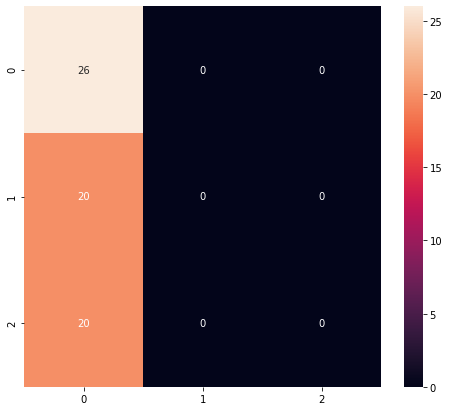

In [87]:
# confusion matrix
from sklearn.metrics import confusion_matrix
y_pred = model.predict(x_tset_pro_rsz)
y_pred1 = np.argmax(y_pred,axis=1)
y_act = np.argmax(y_testOHV,axis=1)

cmat = confusion_matrix(y_act, y_pred1)
cm = pd.DataFrame(cmat, index = [i for i in range(0, 3)],columns = [i for i in range(0, 3)])
                  
plt.figure(figsize = (8,7))
sns.heatmap(cm, annot=True, fmt='g');

**the accuracy is still so poor, I will change the labels sets to be classified on "Normal" and "Unhealthy" basis.**

In [105]:
TrainLabels_new = TrainLabels.replace(['Viral Pneumonia','Covid'],'Unhealthy')
print(TrainLabels_new.value_counts(),'\n')

TestLabels_new = TestLabels.replace(['Viral Pneumonia','Covid'],'Unhealthy')
print(TestLabels_new.value_counts(),'\n')


y_trainOHV2 = pd.get_dummies(TrainLabels_new)
y_testOHV2 = pd.get_dummies(TestLabels_new)

#ohv2 = LabelBinarizer()
#y_trainOHV2 = ohv2.fit_transform(TrainLabels_new)
#y_testOHV2 = ohv2.fit_transform(TestLabels_new)

print(y_trainOHV2.shape)
print(y_testOHV2.shape)

Label    
Unhealthy    181
Normal        70
dtype: int64 

Label    
Unhealthy    46
Normal       20
dtype: int64 

(251, 2)
(66, 2)


In [111]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), padding='valid', activation="relu", input_shape=(m,m, 1)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))

model.add(layers.Conv2D(32, (3, 3), padding='valid', activation="relu"))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))

model.add(layers.Conv2D(64, (3, 3), padding='valid', activation="relu"))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))

model.add(layers.Conv2D(128, (3, 3), padding='valid', activation="relu"))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))

model.add(layers.GlobalMaxPooling2D())
model.add(layers.Dense(256, activation="relu"))
#model.add(layers.Dropout(0.2))
model.add(layers.Dense(128, activation="relu"))
#model.add(layers.Dropout(0.2))
model.add(layers.Dense(2, activation="softmax"))



#########################################################################################################################
###########################################################################################################################
# creating validation set from test set with 20% split size
x_test2, x_val2, y_test2, y_val2 = train_test_split(x_tset_pro_rsz, y_testOHV2, test_size = 0.3, random_state=7)
###########################################################################################################################

# applying image data augmentation technique via the ImageDataGenerator class, to expand the size of a training dataset
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# construct Image Data Generator for Train Set
TrnSet_ImgGen2 = ImageDataGenerator(
                                   #shear_range = 0.2,
                                   zoom_range = [0.7,3],
                                   horizontal_flip = True,
                                   brightness_range=[0.1,1.9],
                                   rotation_range=10,
                                   #fill_mode='nearest',
                                   height_shift_range=0.10,                          
                                   width_shift_range= 0.10
                                   
                                                                    )

# construct Image Data Generator for test & validation Sets
#TstSet_ImgGen = ImageDataGenerator()
#ValSet_ImgGen = ImageDataGenerator()

# create the iterator for the three sets
batchSize = 32
train_ImGen2 = TrnSet_ImgGen2.flow(x_train_pro_rsz,y_trainOHV2,batch_size = batchSize)
#tset_ImGen = TstSet_ImgGen.flow(x_tset_pro_rsz, y_testOHV,batch_size = batchSize)
#val_ImGen = ValSet_ImgGen.flow(x_val,y_val,batch_size = batchSize)
###########################################################################################################################
# construct the optimizer and loss function.
optimizer = Adam(learning_rate=0.001,name='Adam')
#optimizer = RMSprop(learning_rate=0.001)
#loss='kullback_leibler_divergence'
loss="categorical_crossentropy"
model.compile(optimizer = optimizer, loss = loss, metrics=["accuracy"])

# Fit the model
model.fit_generator( train_ImGen,epochs=30,validation_data = (x_val2,y_val2))                                                                           
###########################################################################################################################
# Evaluate the model
score = model.evaluate(x_tset_pro_rsz,y_testOHV2)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/30
8/8 [==============================] - 2s 196ms/step - loss: 5.7474 - accuracy: 0.5358 - val_loss: 0.6851 - val_accuracy: 0.7500
Epoch 2/30
8/8 [==============================] - 1s 169ms/step - loss: 3.0489 - accuracy: 0.2375 - val_loss: 0.6810 - val_accuracy: 0.7500
Epoch 3/30
8/8 [==============================] - 1s 170ms/step - loss: 2.5612 - accuracy: 0.3155 - val_loss: 0.6854 - val_accuracy: 0.7500
Epoch 4/30
8/8 [==============================] - 1s 171ms/step - loss: 3.1077 - accuracy: 0.3674 - val_loss: 0.6806 - val_accuracy: 0.7500
Epoch 5/30
8/8 [==============================] - 1s 175ms/step - loss: 4.1401 - accuracy: 0.5271 - val_loss: 0.6824 - val_accuracy: 0.7500
Epoch 6/30
8/8 [==============================] - 1s 167ms/step - loss: 5.5194 - accuracy: 0.5247 - val_loss: 0.6803 - val_accuracy: 0.7500
Epoch 7/30
8/8 [==============================] - 1s 173ms/step - loss: 18.1706 - accuracy: 0.3941 - val_loss: 0.6731 - val_accuracy: 0.7500
Epoch 8/30
8/8 [===

**the accuracy is improved to be 69.7%.**





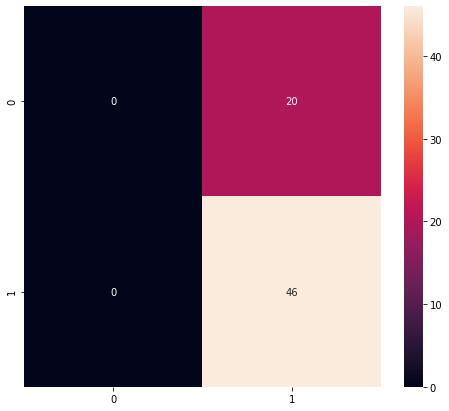

In [175]:
# confusion matrix

y_pred2 = model.predict(x_tset_pro_rsz)
y_predr2 = np.argmax(y_pred2,axis=1)
y_act2 = np.argmax(y_testOHV2.values,axis=1)

cmat2 = confusion_matrix(y_act2, y_predr2)
cm = pd.DataFrame(cmat2, index = [i for i in range(0, 2)],columns = [i for i in range(0, 2)])
                  
plt.figure(figsize = (8,7))
sns.heatmap(cm, annot=True, fmt='g');

**as seen the accuracy increased to 69.7% and the recall to 100%**

**Visualize predictions for x_test[2], x_test[3], x_test[33], x_test[36], x_test[59]**

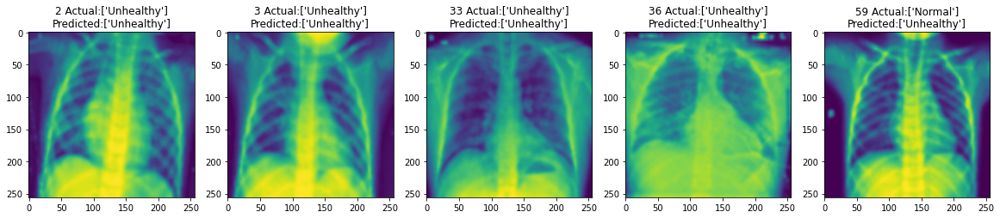

In [199]:
#convert the the actual and predicted labels from one-hot coded to categorical string

y_tst = y_testOHV2[y_testOHV2==1].stack().reset_index().drop(['level_0',0],axis=1)
y_tst = y_tst.rename(columns={'level_1': 'status'})
y_tst = y_tst.replace({'Label_Unhealthy':'Unhealthy','Label_Normal':'Normal'})
y_predict = pd.DataFrame(y_predr2)
y_predict = y_predict.rename(columns={0: 'status'})
y_predict = y_predict.replace({1:'Unhealthy',0:'Normal'})

plt.figure(figsize=(20,20))
for n,i in enumerate([2,3,33,36,59]):
    plt.subplot(1, 5, n + 1)
    plt.imshow(np.reshape(x_tset_pro_rsz[i],(256,256)))
    plt.title(str(i)+' Actual:'+str(y_tst.iloc[i].values)+'\n'+'Predicted:'+str(y_predict.iloc[i].values))
